In [ ]:
#Import Kaggle Data Into Colab
from google.colab import files

files.upload()

Saving kaggle.json to kaggle.json


{'kaggle.json': b'{"username":"aimllearner","key":"144fca1e613242a6b9b0c9cd5c1b9a0c"}'}

In [ ]:
#Install Kaggle API
!pip install -q kaggle

In [ ]:
!mkdir -p ~/.kaggle

In [ ]:
#Moving the Kaggle API to appropriate folder
!cp kaggle.json ~/.kaggle/

In [ ]:
#List of Kaggle Datasets
!kaggle datasets list

ref                                                         title                                                size  lastUpdated          downloadCount  
----------------------------------------------------------  --------------------------------------------------  -----  -------------------  -------------  
allen-institute-for-ai/CORD-19-research-challenge           COVID-19 Open Research Dataset Challenge (CORD-19)    3GB  2020-06-23 00:53:41          83337  
roche-data-science-coalition/uncover                        UNCOVER COVID-19 Challenge                          179MB  2020-05-21 18:57:53          14286  
mikahama/the-best-sarcasm-annotated-dataset-in-spanish      The Best Sarcasm Annotated Dataset in Spanish        26KB  2020-06-21 16:50:44             37  
jessemostipak/caribou-location-tracking                     Caribou Location Tracking                             6MB  2020-06-22 21:44:58             49  
rohan0301/unsupervised-learning-on-country-data             Unsu

In [ ]:
#List of datasets related to Credit Card Fraud
!kaggle datasets list -s creditcardfraud

ref                                       title                                size  lastUpdated          downloadCount  
----------------------------------------  -----------------------------------  ----  -------------------  -------------  
isaikumar/creditcardfraud                 Credit Card Fraud Detection Dataset  66MB  2018-05-05 09:38:01           2479  
rikdifos/credit-card-approval-prediction  Credit Card Approval Prediction       5MB  2020-03-24 10:04:48           2039  
mlg-ulb/creditcardfraud                   Credit Card Fraud Detection          66MB  2018-03-23 01:17:27         229263  


In [ ]:
# Download the CreditCard Fraud Detection Dataset locally
!kaggle datasets download -d mlg-ulb/creditcardfraud

 62% 41.0M/66.0M [00:01<00:01, 22.0MB/s]
100% 66.0M/66.0M [00:01<00:00, 38.0MB/s]


In [ ]:
#List of contents downloaded
!ls /content

 creditcard.csv       'kaggle (1).json'   sample_data
 creditcardfraud.zip   kaggle.json


In [ ]:
#Unzip the dataset
!unzip creditcardfraud.zip

Archive:  creditcardfraud.zip
  inflating: creditcard.csv          


In [ ]:
!ls /content

sample_data


In [ ]:
#Importing Necessary Libraries for data loading, exploration
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns

In [ ]:
#Loading File using Pandas
ccdata = pd.read_csv('creditcard.csv')

In [ ]:
#Checking Head
ccdata.head()

,Time,V1,V2,V3,V4,V5,V6,V7,V8,V9,V10,V11,V12,V13,V14,V15,V16,V17,V18,V19,V20,V21,V22,V23,V24,V25,V26,V27,V28,Amount,Class
0,0.0,-1.359807,-0.072781,2.536347,1.378155,-0.338321,0.462388,0.239599,0.098698,0.363787,0.090794,-0.551600,-0.617801,-0.991390,-0.311169,1.468177,-0.470401,0.207971,0.025791,0.403993,0.251412,-0.018307,0.277838,-0.110474,0.066928,0.128539,-0.189115,0.133558,-0.021053,149.62,0
1,0.0,1.191857,0.266151,0.166480,0.448154,0.060018,-0.082361,-0.078803,0.085102,-0.255425,-0.166974,1.612727,1.065235,0.489095,-0.143772,0.635558,0.463917,-0.114805,-0.183361,-0.145783,-0.069083,-0.225775,-0.638672,0.101288,-0.339846,0.167170,0.125895,-0.008983,0.014724,2.69,0
2,1.0,-1.358354,-1.340163,1.773209,0.379780,-0.503198,1.800499,0.791461,0.247676,-1.514654,0.207643,0.624501,0.066084,0.717293,-0.165946,2.345865,-2.890083,1.109969,-0.121359,-2.261857,0.524980,0.247998,0.771679,0.909412,-0.689281,-0.327642,-0.139097,-0.055353,-0.059752,378.66,0
3,1.0,-0.966272,-0.185226,1.792993,-0.863291,-0.010309,1.247203,0.237609,0.377436,-1.387024,-0.054952,-0.226487,0.178228,0.507757,-0.287924,-0.631418,-1.059647,-0.684093,1.965775,-1.232622,-0.208038,-0.108300,0.005274,-0.190321,-1.175575,0.647376,-0.221929,0.062723,0.061458,123.50,0
4,2.0,-1.158233,0.877737,1.548718,0.403034,-0.407193,0.095921,0.592941,-0.270533,0.817739,0.753074,-0.822843,0.538196,1.345852,-1.119670,0.175121,-0.451449,-0.237033,-0.038195,0.803487,0.408542,-0.009431,0.798278,-0.137458,0.141267,-0.206010,0.502292,0.219422,0.215153,69.99,0


In [ ]:
#Get DataFrame Info
ccdata.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 284807 entries, 0 to 284806
Data columns (total 31 columns):
 #   Column  Non-Null Count   Dtype  
---  ------  --------------   -----  
 0   Time    284807 non-null  float64
 1   V1      284807 non-null  float64
 2   V2      284807 non-null  float64
 3   V3      284807 non-null  float64
 4   V4      284807 non-null  float64
 5   V5      284807 non-null  float64
 6   V6      284807 non-null  float64
 7   V7      284807 non-null  float64
 8   V8      284807 non-null  float64
 9   V9      284807 non-null  float64
 10  V10     284807 non-null  float64
 11  V11     284807 non-null  float64
 12  V12     284807 non-null  float64
 13  V13     284807 non-null  float64
 14  V14     284807 non-null  float64
 15  V15     284807 non-null  float64
 16  V16     284807 non-null  float64
 17  V17     284807 non-null  float64
 18  V18     284807 non-null  float64
 19  V19     284807 non-null  float64
 20  V20     284807 non-null  float64
 21  V21     28

In [ ]:
#List of Columns in Dataframe
ccdata.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

Above Info Indicates: 30 Columns [Time, V1 to V28, Amount, Class]

As per the description given in Kaggle, V1 to V28 are transformed using PCA [Confidentiality issues]

Time, Amount are not transformed/normalized

Fraud/Normal is indicated by Class Column: Fraud: 1, Normal: 0

Lets Begin the Data Exploration
1. Check if any null values are present, if so : need to do relevant imputation
2. Check possible/unique values for each column. 
    Ensure only 1/0 are given for all Class column
3.Do Uni-variate and Bi-Variate Analysis and observe any patterns emerge

In [ ]:
#Checking for NULL Values in given data
ccdata.isnull().sum()

Time      0
V1        0
V2        0
V3        0
V4        0
V5        0
V6        0
V7        0
V8        0
V9        0
V10       0
V11       0
V12       0
V13       0
V14       0
V15       0
V16       0
V17       0
V18       0
V19       0
V20       0
V21       0
V22       0
V23       0
V24       0
V25       0
V26       0
V27       0
V28       0
Amount    0
Class     0
dtype: int64

No NULL Values from the above result -> Not using any imputation method at this stage

In [ ]:
#Identify how many Fraud/Non-Fraud samples are available
ccdata['Class'].value_counts()

0    284315
1       492
Name: Class, dtype: int64

The data looks like highly biased as the fraudulent samples are only 0.17% of whole dataset

In next steps of modeling, this has to be keep in mind for choosing train, test datasets

In [ ]:
#For easy processing, extract Fraud and Non-Fraud Dataframes
fraud_df = ccdata[ccdata['Class']== 1]
nonfraud_df = ccdata[ccdata['Class'] == 0]

In [ ]:
#Ensuring the data extracted correctly, by checking the length - Should match with cdata['Class'].value_counts() in above step
len(fraud_df), len(nonfraud_df)

(492, 284315)

Let's begin Un-variate Analysis
1. 'Amount' -> Any pattern in amount for fraud/non-fraud transactions
    
    Since this is a numerical field, check the min, max, median and also distribution of the feature

In [ ]:
np.min(fraud_df['Amount']), np.max(fraud_df['Amount']), np.mean(fraud_df['Amount']), np.median(fraud_df['Amount'])

(0.0, 2125.87, 122.21132113821133, 9.25)

In [ ]:
np.min(nonfraud_df['Amount']), np.max(nonfraud_df['Amount']), np.mean(nonfraud_df['Amount']), np.median(nonfraud_df['Amount'])

(0.0, 25691.16, 88.29102242225574, 22.0)

In [ ]:
#Transactions with Amount 0.0 in both Fraud and Non-Fraud
len(fraud_df[fraud_df['Amount'] == 0.0]), len(nonfraud_df[nonfraud_df['Amount'] == 0.0])

(27, 1798)

From the above information:
  1. Fraud Transaction: Max Amount: 2125.87, Median Amount: 122.211
  2. Non-Fraud Transaction: Max Amount: 25691.16, Median Amount: 88.29
  3. There are rows with amount = 0.0 in Fraud[5%], Non-Fraud[0.6%] --> Probably need Imputation??

Lets get the distribution of 'Amount' to know majority of transaction amount

In [ ]:
zeroA_fraud = len(fraud_df[fraud_df['Amount'] == 0.0])
zeroA_nonfraud = len(nonfraud_df[nonfraud_df['Amount'] == 0.0])

perZA_fraud = (zeroA_fraud/len(fraud_df))*100
perZA_nonfraud = (zeroA_nonfraud/len(nonfraud_df))*100

print('Percent of \'0\' value transactions in Fraud: ', perZA_fraud)
print('Percent of \'0\' value transactions in Non-Fraud: ', perZA_nonfraud)

Percent of '0' value transactions in Fraud:  5.487804878048781
Percent of '0' value transactions in Non-Fraud:  0.6323971651161564


(<matplotlib.axes._subplots.AxesSubplot at 0x7fa04d2c7d68>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7fa04d2c7d68>)

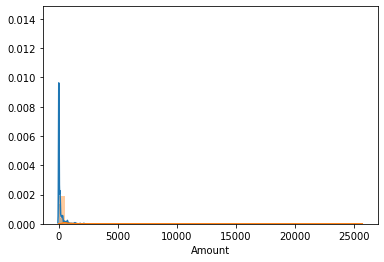

In [ ]:
sns.distplot(fraud_df['Amount']), sns.distplot(nonfraud_df['Amount'])

(<matplotlib.axes._subplots.AxesSubplot at 0x7f09b9ef10f0>,
 <matplotlib.axes._subplots.AxesSubplot at 0x7f09b9ef10f0>)

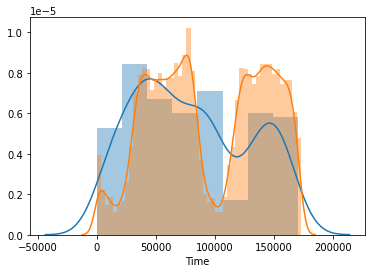

In [ ]:
sns.distplot(fraud_df['Time']), sns.distplot(nonfraud_df['Time'])

Most of the amount in the transaction given are in low ranges, not very clear on how much is the amount from these charts.Checking other distribution plot

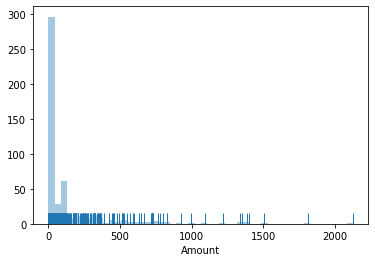

In [ ]:
sns.distplot(fraud_df['Amount'], kde=False, rug=True)

From the above plot, most of the transactions are about 100 or so [Median Value~122]

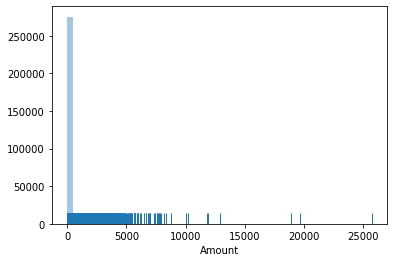

In [ ]:
sns.distplot(nonfraud_df['Amount'], kde=False, rug=True)

From the above plot, most of the transactions are < 5000 [Median Value ~ 88]

Text(0, 0.5, 'Class')

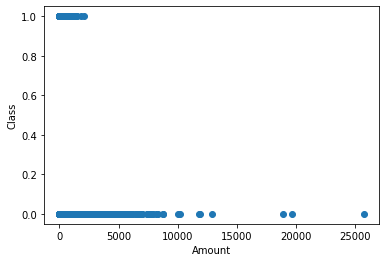

In [ ]:
#Scatter Plot combining both fraud and non-fraud
plt.scatter(ccdata['Amount'],ccdata['Class'])
plt.xlabel('Amount')
plt.ylabel('Class')

Uni-Variate Analysis: No Specific patterns observed in 'Amount' feature [Cannot decide less amount means Fraud, more amount means Non-Fraud]

Checking if 'Time' has any patterns in fraud transactions

Text(0, 0.5, 'Class')

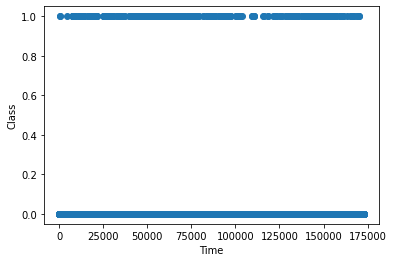

In [ ]:
#Scatter Plot combining both fraud and non-fraud
plt.scatter(ccdata['Time'],ccdata['Class'])
plt.xlabel('Time')
plt.ylabel('Class')

Fraud and Non-Fraud Transactions are happening across all times of day, no specific patterns emerged from above plot.

Checking individual plots for 'Time' if any other patterns can be identified

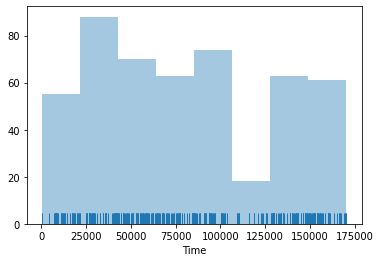

In [ ]:
sns.distplot(fraud_df['Time'], kde=False, rug=True)

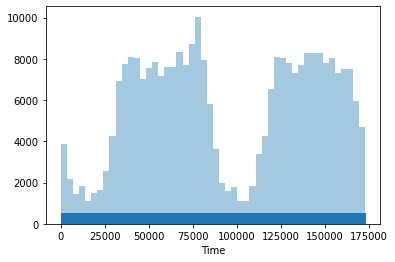

In [ ]:
sns.distplot(nonfraud_df['Time'], kde=False, rug=True)

Uni-Variate Analysis: No Specific patterns observed in 'Time' feature

Checking plots for other columns: V1 to V28

Text(0, 0.5, 'Class')

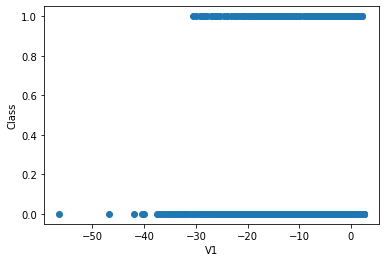

In [ ]:
plt.scatter(ccdata['V1'],ccdata['Class'])
plt.xlabel('V1')
plt.ylabel('Class')

Text(0, 0.5, 'Class')

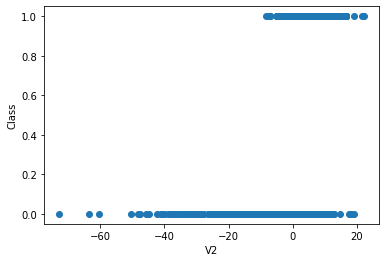

In [ ]:
plt.scatter(ccdata['V2'],ccdata['Class'])
plt.xlabel('V2')
plt.ylabel('Class')

Text(0, 0.5, 'Amount')

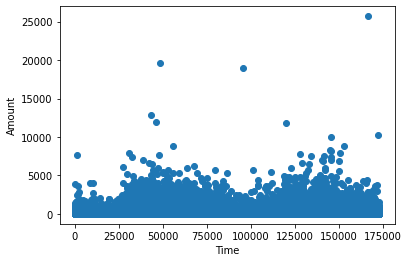

In [ ]:
#Scatter Plot combining both fraud and non-fraud
plt.scatter(ccdata['Time'],ccdata['Amount'])
plt.xlabel('Time')
plt.ylabel('Amount')

Text(0, 0.5, 'Amount')

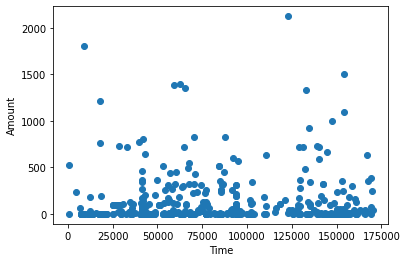

In [ ]:
plt.scatter(fraud_df['Time'], fraud_df['Amount'])
plt.xlabel('Time')
plt.ylabel('Amount')

Text(0, 0.5, 'Amount')

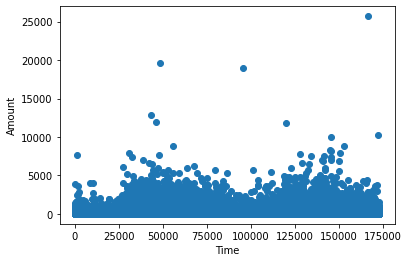

In [ ]:
plt.scatter(nonfraud_df['Time'], nonfraud_df['Amount'])
plt.xlabel('Time')
plt.ylabel('Amount')

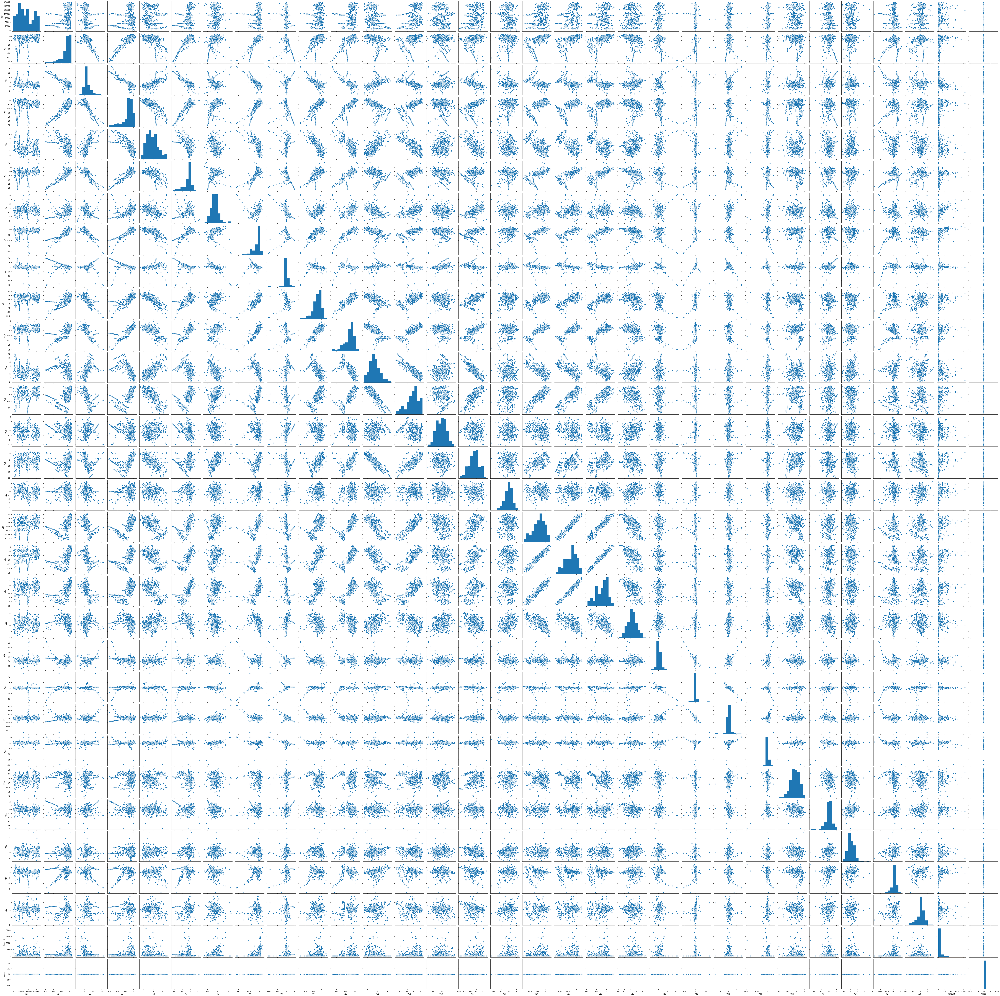

In [ ]:
sns.pairplot(fraud_df)

Tried using Pairplot to understand the distribution - However too much data, not really understanding anything from the above. Probably this will make more sense in later steps

Continuing with Uni-Variate Analysis
Identifying outliers for the columns from V1 to V28 using Boxplots

In [ ]:
fraud_df.columns

Index(['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10',
       'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
       'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount',
       'Class'],
      dtype='object')

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


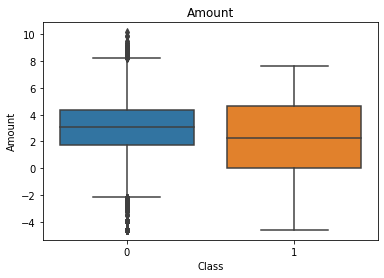

In [ ]:
column = 'Amount'
ccdata[column]=np.log(ccdata[column])
sns.boxplot(y = column, x = 'Class', data = ccdata)
plt.ylabel(column)
plt.title(column)
plt.yticks()
plt.show()

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: divide by zero encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


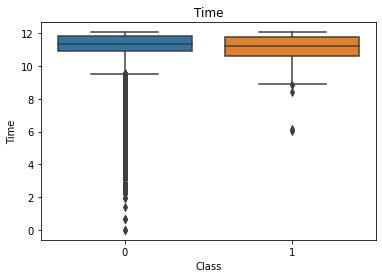

In [ ]:
column = 'Time'
ccdata[column]=np.log(ccdata[column])
sns.boxplot(y = column, x = 'Class', data = ccdata)
plt.ylabel(column)
plt.title(column)
plt.yticks()
plt.show()

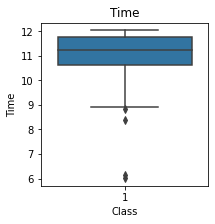

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


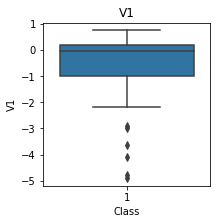

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


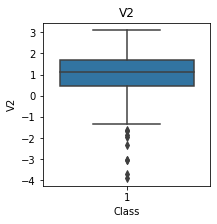

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


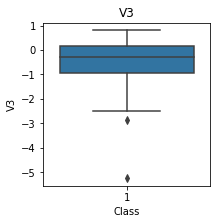

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


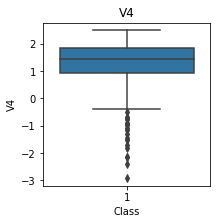

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


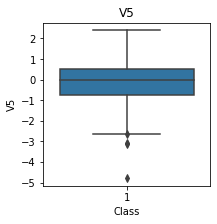

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


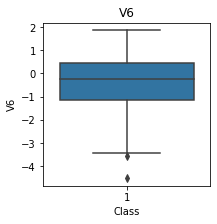

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


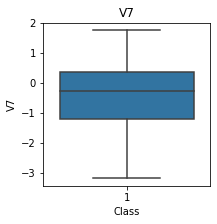

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


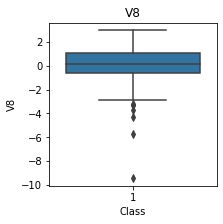

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


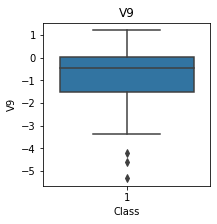

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


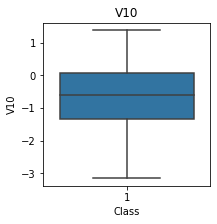

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


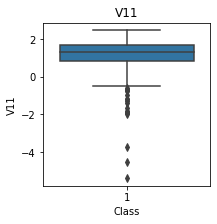

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


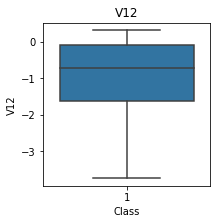

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


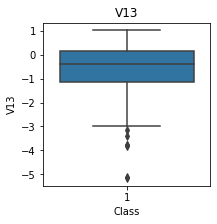

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


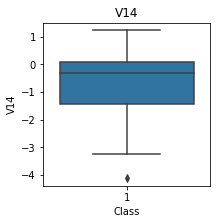

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


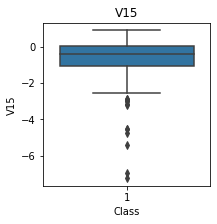

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


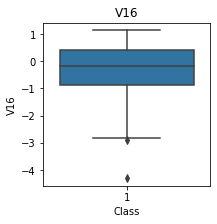

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


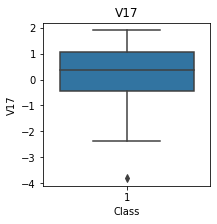

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


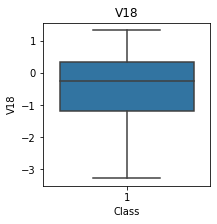

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


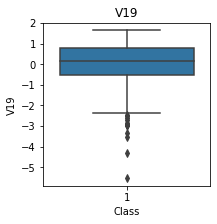

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


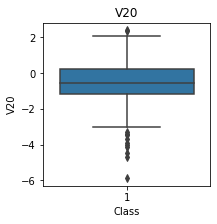

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


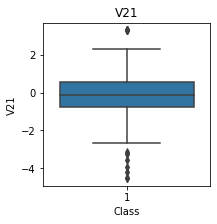

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


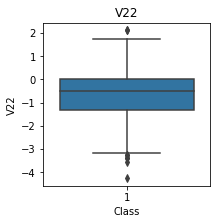

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


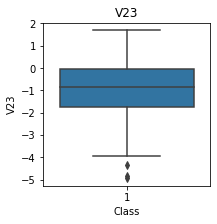

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


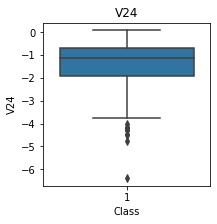

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


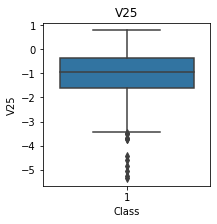

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


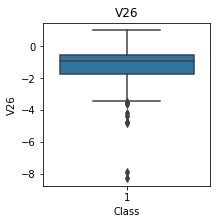

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


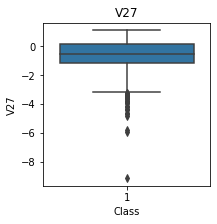

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


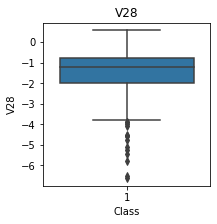

<Figure size 216x216 with 0 Axes>

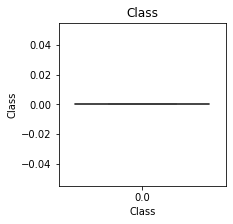

In [ ]:
for i, column in enumerate(fraud_df.columns):
  plt.figure(figsize = (3, 3))
  data = fraud_df.copy()
  if 0 in data[column].unique():
    pass
  else:
    data[column]=np.log(data[column])
    sns.boxplot(y = column, x = 'Class', data = data)
    plt.ylabel(column)
    plt.title(column)
    plt.yticks()
    plt.show()

Not sure, if outliers of these columns will have any impact in modelling since these features are PCA normalized and no information on what each column representing

Moving onto Correlations among variables

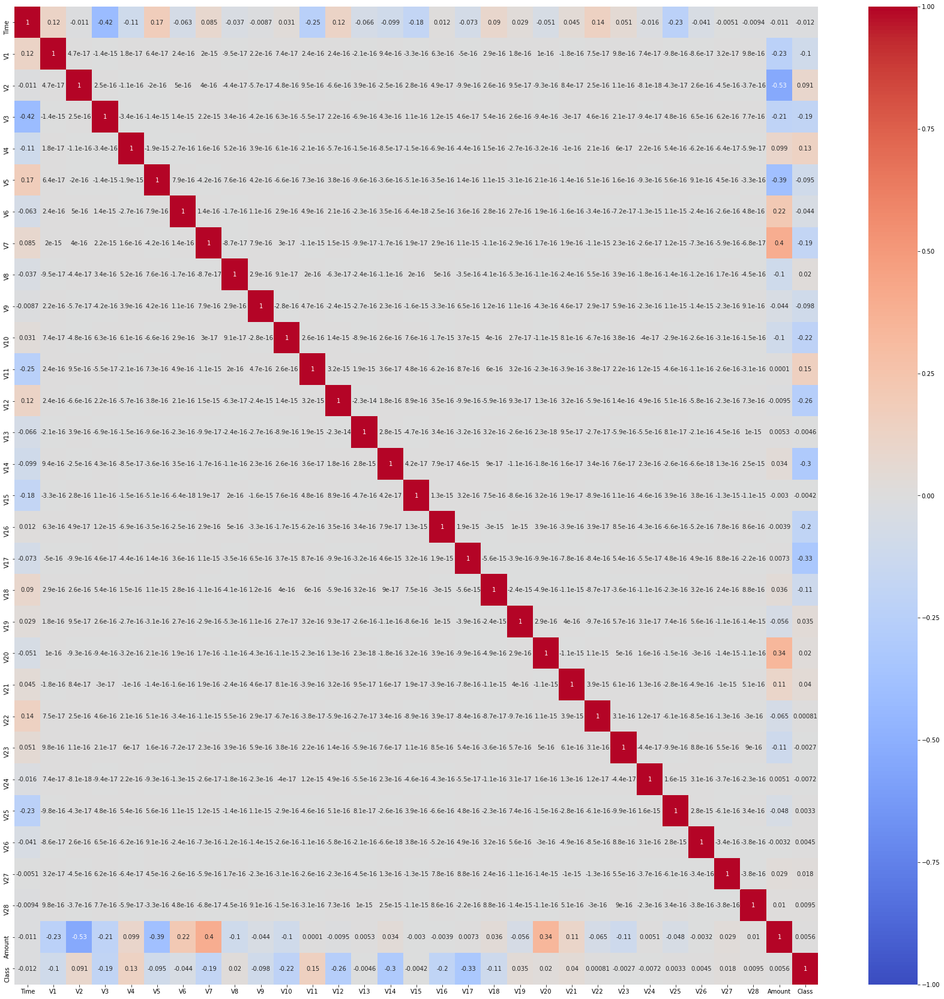

In [ ]:
plt.figure(figsize = (30, 30))

corr_mat = ccdata.corr()
sns.heatmap(corr_mat, xticklabels = corr_mat.columns, yticklabels = corr_mat.columns, annot=True, vmin=-1, cmap='coolwarm')

No Correlation observed among the variables from the above heatmap [Already the features were PCA normalized]

From all the analysis:
1. No patterns for 'Amount', 'Time' observed w.r.t Fraudulent/Non-Fraudulent transactions
2. No correlations among features

Feature-Engineering

1) From the box-plots, tried using the features which are in similar data d

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


<Figure size 216x216 with 0 Axes>

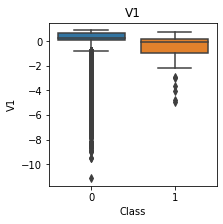

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


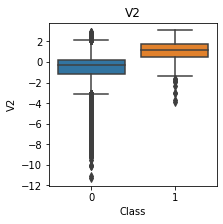

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


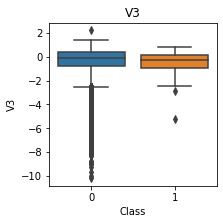

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


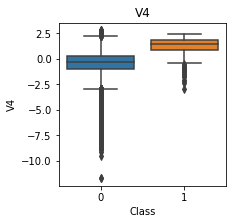

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


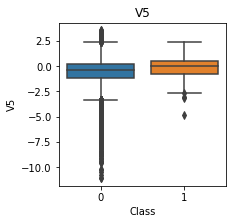

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


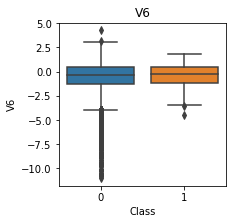

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


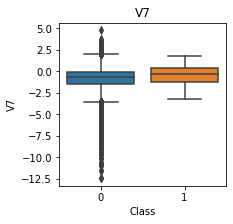

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


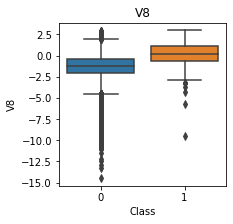

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


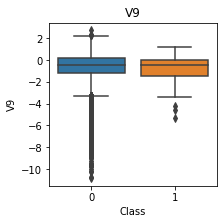

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


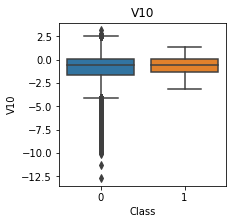

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


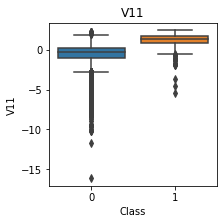

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


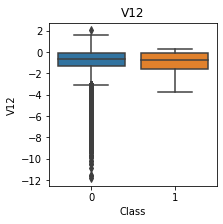

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


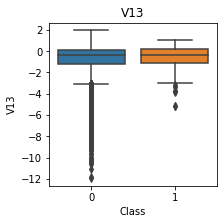

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


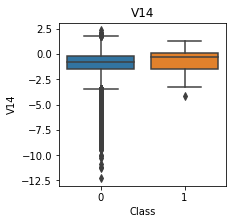

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


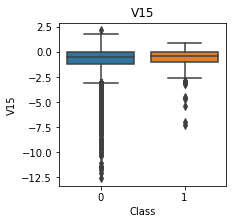

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


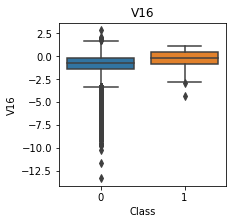

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


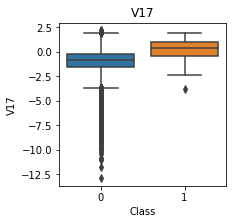

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


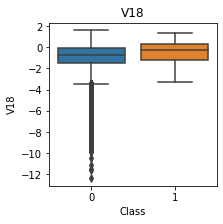

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


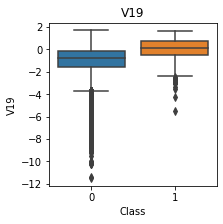

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


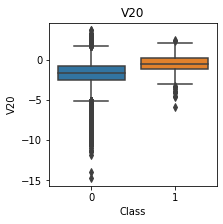

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


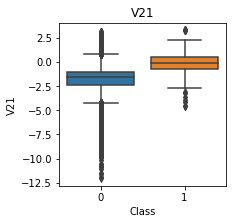

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


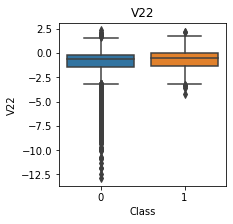

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


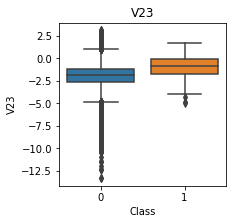

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


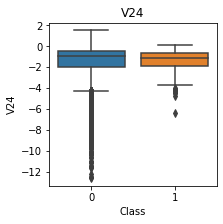

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


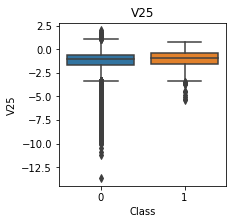

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


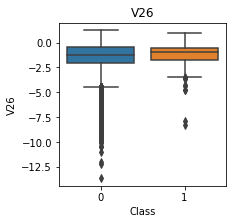

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


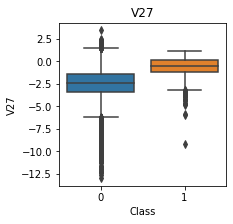

/usr/local/lib/python3.6/dist-packages/pandas/core/series.py:679: RuntimeWarning: invalid value encountered in log
  result = getattr(ufunc, method)(*inputs, **kwargs)


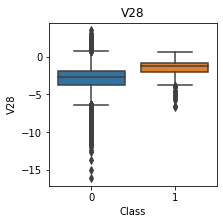

<Figure size 216x216 with 0 Axes>

<Figure size 216x216 with 0 Axes>

In [ ]:
for i, column in enumerate(ccdata.columns):
  plt.figure(figsize = (3, 3))
  data = ccdata.copy()
  if 0 in data[column].unique():
    pass
  else:
    data[column]=np.log(data[column])
    sns.boxplot(y = column, x = 'Class', data = data)
    plt.ylabel(column)
    plt.title(column)
    plt.yticks()
    plt.show()

Based on the above box plots, choosing the features which have similar data distribution for Fraud and Genuine classes. These features are defined as CORREL_FEATURES and is used in validating with various algos. 

The features that are not CORREL_FEATURES are defined as NON_CORREL_FEATURES

CORREL_FEATURES: ['V3', 'V5', 'V6', 'V7', 'V9', 'V10', 'V12' ,'V13', 'V14', 'V15', 'V18', 'V22', 'V24', 'V25', 'V26']

NON_CORREL_FEATURES: ['V1', 'V2', 'V4', 'V8', 'V11', 'V16', 'V17' ,'V19', 'V20', 'V21', 'V23', 'V27', 'V28']

In-addition to above approach, also using RandomForest algorithm to identify the prominent features

In [ ]:
#importing necessary libraries
from sklearn.linear_model import LogisticRegression
from sklearn.tree import DecisionTreeClassifier
from sklearn.ensemble import RandomForestClassifier
from sklearn import svm
from sklearn.naive_bayes import GaussianNB
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import KFold

/usr/local/lib/python3.6/dist-packages/sklearn/externals/six.py:31: FutureWarning: The module is deprecated in version 0.21 and will be removed in version 0.23 since we've dropped support for Python 2.7. Please rely on the official version of six (https://pypi.org/project/six/).
  "(https://pypi.org/project/six/).", FutureWarning)
/usr/local/lib/python3.6/dist-packages/sklearn/utils/deprecation.py:144: FutureWarning: The sklearn.neighbors.base module is  deprecated in version 0.22 and will be removed in version 0.24. The corresponding classes / functions should instead be imported from sklearn.neighbors. Anything that cannot be imported from sklearn.neighbors is now part of the private API.
  warnings.warn(message, FutureWarning)


In [ ]:
from sklearn.model_selection import train_test_split
from sklearn.metrics import accuracy_score, confusion_matrix, classification_report
from sklearn.model_selection import cross_val_score

Utility function for train-test splitting

In [ ]:
#Split the input data based on given input
#Default: 70-30%
def getTrainTestSplit(X, y, split='70', seed = 0):
  if(split == '90'):
    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.10, random_state=seed)
  elif(split == '80'):
    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.20, random_state=seed)
  elif(split == '70'):
    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.30, random_state=seed)
  elif(split == '65'):
    X_train, X_test, y_train, y_test = train_test_split(X, y,test_size=0.35, random_state=seed)

  print('X_train.shape: ',X_train.shape, 'X_test.shape: ', X_test.shape, 'y_train.shape: ', y_train.shape, 'y_test.shape: ', y_test.shape)
  return X_train, X_test, y_train, y_test

Utility function for feature extraction from the given data

In [ ]:
#Extract the features based on input type
'''
  ALL_FEATURES: Use all the features, as-is, nothing dropped
  CORREL_FEATURES: The features where the data distribution is in similar range for both FRAUD and GENUINE samples
  NON_CORREL_FEATURES: The features where the data distribution is in different range for both FRAUD and GENUINE samples
  RF_FEATURES: The featuers that were found importance in RandomForest Evaluation  
'''
def getFeatures(data, featType = 'ALL_FEATURES'):
  data_use = data.copy()
  #Dropping Time feature as it is not contributing much differentiation
  #Norm_Amount is used in place of Amount
  X = data_use.drop(['Class', 'Time', 'Amount'], axis = 1)
  y = data_use['Class']

  if(featType == 'CORREL_FEATURES'):
    X = data_use.drop(['V3', 'V5', 'V6', 'V7', 'V9', 'V10', 'V12' ,'V13', 'V14', 'V15', 'V18', 'V22', 'V24', 'V25', 'V26'], axis = 1)
  elif(featType == 'NON_CORREL_FEATURES'):
    X = data_use.drop(['V1', 'V2', 'V4', 'V8', 'V11', 'V16', 'V17' ,'V19', 'V20', 'V21', 'V23', 'V27', 'V28'], axis = 1)    
  elif(featType == 'RF_FEATURES'):
    X = data_use[['V9', 'V10', 'V11', 'V13', 'V15', 'V16', 'V17']]

  print('X.Shape: ',X.shape, ' Y.Shape: ', y.shape)
  return X, y

Utility function to get the classifier [As multiple classifiers are used for testing, wrote a utility function for ease of use]

In [ ]:
def getClassifier(classifier_type='RandomForest'):
  if(classifier_type == 'LogisticRegression'):
    classifier = LogisticRegression()
  elif(classifier_type == 'DecisionTree'):
    classifier = DecisionTreeClassifier()
  elif(classifier_type == 'SVM'):
    classifier = svm.SVC(kernel='poly', C=1)
  elif(classifier_type == 'NaiveBayes'):
    classifier = GaussianNB()    
  else:
    classifier = RandomForestClassifier(random_state=0)

  return classifier

Utility function to get the dataset: Multiple methods are used [UNDER_SAMPLING, OVER_SAMPLING, SMOTE]

In [ ]:
#Get the dataset
def getData(data, datatype = 'ORIGINAL'):
  data_use = data.copy()

  if(datatype == 'ORIGINAL'):
    #Return the original dataset as-is: Highly imbalanced: Fraud is of 0.017% of Total Samples
    print('Data Shape: ',data_use.shape)
    return data_use
  elif(datatype == 'UNDER_SAMPLE'):
    ''' 
      Return the sample dataset from the original dataset
      Since Fraud Samples are 492, Extracting same number of samples [choosen randomly] from the Genuine Samples as well
      Returned dataset is a fraction of original dataset: 984 Samples [out of 284,807], but the classes are balanced
    '''
    df_fraud = data_use[data_use['Class']==1]
    df_genuine = data_use[data_use['Class']==0]
    df_genuine = df_genuine.sample(n = len(df_fraud), replace = False)
    data_use = pd.concat([df_fraud, df_genuine])
    print('Data Shape: ',data_use.shape)    
    return data_use
  elif(datatype == 'OVER_SAMPLE'):
    ''' 
      Return the over sampled dataset from the original dataset
      Since Genuine Samples are 284315, Generating same number of synthetic samples from the Fraud Samples
      Returned dataset is a almost double of original dataset: 568630 Samples [compared to 284,807], but the classes are balanced
    '''    
    df_fraud = data_use[data_use['Class']==1]
    df_genuine = data_use[data_use['Class']==0]
    df_fraud = df_fraud.sample(n = len(df_genuine), replace = True)
    data_use = pd.concat([df_fraud, df_genuine])
    print('Data Shape: ',data_use.shape)    
    return data_use 
  elif(datatype == 'SMOTE'):
    df_fraud = data_use[data_use['Class']==1]
    df_genuine = data_use[data_use['Class']==0]
    X = data_use.drop(['Class'], axis=1)
    y = data_use['Class']
    sm = SMOTE(ratio='auto',kind='regular')
    X_sampled,y_sampled = sm.fit_sample(X,y.values.ravel())
    column_names = ['Time', 'V1', 'V2', 'V3', 'V4', 'V5', 'V6', 'V7', 'V8', 'V9', 'V10', 'V11', 'V12', 'V13', 'V14', 'V15', 'V16', 'V17', 'V18', 'V19', 'V20',
                    'V21', 'V22', 'V23', 'V24', 'V25', 'V26', 'V27', 'V28', 'Amount']
    X_sampled_df = pd.DataFrame(X_sampled, columns=column_names)
    y_sampled_df = pd.DataFrame(y_sampled, columns=['Class'])
    data_use = pd.concat([X_sampled_df, y_sampled_df])
    print('Data Shape: ',data_use.shape)    
    print('Before SMOTE: NumFraud = ',len(df_fraud), ' Genuine: ', len(df_genuine))
    print('After SMOTE: NumFraud = ',len(data_use[data_use['Class']==1]), ' Genuine: ', len(data_use[data_use['Class']==0]))
    print('Data Shape: ',data_use.shape)    
    return data_use    

Utility function to handle model training

In [ ]:
#Train the model
def train_model(X_train, X_test, y_train, y_test, classifier):
  #print('X_train.shape: ',X_train.shape, 'X_test.shape: ', X_test.shape, 'y_train.shape: ', y_train.shape, 'y_test.shape: ', y_test.shape)

  #Fit the model
  classifier.fit(X_train, y_train)
  #Get Predictions
  y_pred = classifier.predict(X_test)
  #Calculate accuracy
  acc = accuracy_score(y_test, y_pred)
  #Get the confusion matrix
  labels = [0, 1]
  target_names=['Genuine', 'Fraud']
  conf_matrix = confusion_matrix(y_test, y_pred, labels)
  #class_report = classification_report(y_test, y_pred, target_names=target_names)
  class_report = classification_report(y_test, y_pred, target_names = target_names, output_dict=True)
  fp_rate = conf_matrix[1][0]/(conf_matrix[1][0] + conf_matrix[0][0])
  tp_rate = conf_matrix[1][1]/(conf_matrix[1][1] + conf_matrix[0][1])  
  return acc, conf_matrix, class_report, y_pred, fp_rate, tp_rate

In [ ]:
}def show_confusion_matrix(cf_matrix):
  group_names = ['Genuine: TP','Fraud: FP','Genuine: FP','Fraud: TP']
  group_counts = ['{0:0.0f}'.format(value) for value in
                cf_matrix.flatten()]
  group_percentages = ['{0:.2%}'.format(value) for value in
                     cf_matrix.flatten()/np.sum(cf_matrix)]
  labels = [f'{v1}\n{v2}\n{v3}' for v1, v2, v3 in
          zip(group_names,group_counts,group_percentages)]
  labels = np.asarray(labels).reshape(2,2)

  sns.heatmap(cf_matrix, annot=labels, fmt='', cmap='Greens')

Applying Logistic Regression classifier for the given data [as-is] with ALL_FEATURES and generating the confusion matrix, classification report

Data Shape:  (284807, 31)
X.Shape:  (284807, 28)  Y.Shape:  (284807,)
X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  LogisticRegression , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
None
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       0.88      0.62      0.73       136

    accuracy                           1.00     85443
   macro avg       0.94      0.81      0.86     85443
weighted avg       1.00      1.00      1.00     85443



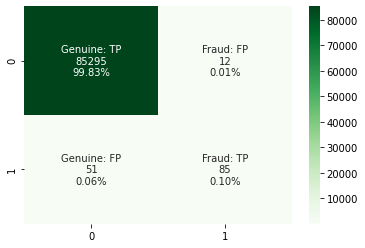

In [ ]:
test_classifiers = 'LogisticRegression'
test_features = 'ALL_FEATURES'
test_datatypes = 'ORIGINAL'
test_split = '70'
test_seed = 42

#Data Sample to use
data_use = getData(ccdata, test_datatypes)
#Features to use in the input data
X, y = getFeatures(data_use, test_features)
#Get the classifier for modelling
classifier = getClassifier(test_classifiers)
#Split the data based on input condition and set the relevant seed
X_train, X_test, y_train, y_test = getTrainTestSplit(X, y, test_split, test_seed)
print(np.unique(y_test, return_counts=True))
print('*****Testing ',test_classifiers, ', Data Split: ',test_split,'(%), feature:',test_features,' Dataset: ',test_datatypes,'*****')
accuracy, conf_matrix, class_report, y_pred, fp_rate, tp_rate = train_model(X_train, X_test, y_train, y_test, classifier)
print(show_confusion_matrix(conf_matrix))
print(class_report)

Recall for 'Fraud' category is 0.62
Inorder to develop a fool proof system, need better recall values for Fraud Category. Will check other classification methods and also data balancing techniques

Methods to improve recall

Feature Engineering:

1) Choose better features: Using Random Forest and identify the prominent features

Data Balancing:

1) UNDER_SAMPLE

2) OVER_SAMPLE

3) Cross-Fold Validation

Modelling:

1) Hyperparameter Tuning

Feature Engineering:

1) Choose better features: Using Random Forest and identify the prominent features

Data Shape:  (284807, 31)
X.Shape:  (284807, 28)  Y.Shape:  (284807,)
X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  RandomForest , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
None
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       0.93      0.81      0.87       136

    accuracy                           1.00     85443
   macro avg       0.97      0.90      0.93     85443
weighted avg       1.00      1.00      1.00     85443



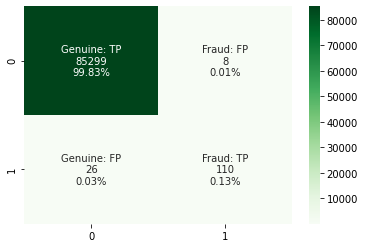

In [ ]:
test_classifiers = 'RandomForest'
test_features = 'ALL_FEATURES'
test_datatypes = 'ORIGINAL'
test_split = '70'
test_seed = 42

#Data Sample to use
data_use = getData(ccdata, test_datatypes)
#Features to use in the input data
X, y = getFeatures(data_use, test_features)
#Get the classifier for modelling
classifier = getClassifier(test_classifiers)
#Split the data based on input condition and set the relevant seed
X_train, X_test, y_train, y_test = getTrainTestSplit(X, y, test_split, test_seed)
print(np.unique(y_test, return_counts=True))
print('*****Testing ',test_classifiers, ', Data Split: ',test_split,'(%), feature:',test_features,' Dataset: ',test_datatypes,'*****')
accuracy, conf_matrix, class_report, y_pred, fp_rate, tp_rate = train_model(X_train, X_test, y_train, y_test, classifier)
print(show_confusion_matrix(conf_matrix))
print(class_report)

Feature ranking:
1. feature 16 (0.189360)
2. feature 11 (0.163744)
3. feature 13 (0.089879)
4. feature 10 (0.077971)
5. feature 9 (0.077340)
6. feature 15 (0.050286)
7. feature 8 (0.036153)
8. feature 17 (0.031514)
9. feature 6 (0.026482)
10. feature 3 (0.024468)
11. feature 25 (0.018572)
12. feature 2 (0.017069)
13. feature 0 (0.017063)
14. feature 19 (0.014861)
15. feature 20 (0.014107)
16. feature 18 (0.014047)
17. feature 5 (0.013818)
18. feature 26 (0.013437)
19. feature 14 (0.013076)
20. feature 7 (0.012816)
21. feature 4 (0.012478)
22. feature 1 (0.011211)
23. feature 12 (0.010880)
24. feature 24 (0.010725)
25. feature 27 (0.010713)
26. feature 23 (0.010596)
27. feature 21 (0.008752)
28. feature 22 (0.008583)


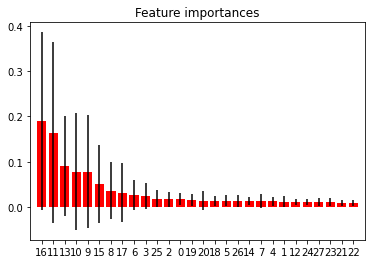

In [ ]:
from matplotlib.pyplot import figure

importances = classifier.feature_importances_
std = np.std([tree.feature_importances_ for tree in classifier.estimators_],
             axis=0)
indices = np.argsort(importances)[::-1]

# Print the feature ranking
print("Feature ranking:")

for f in range(X.shape[1]):
    print("%d. feature %d (%f)" % (f + 1, indices[f], importances[indices[f]]))

# Plot the impurity-based feature importances of the forest
plt.figure()
plt.title("Feature importances")
plt.bar(range(X.shape[1]), importances[indices],
        color="r", yerr=std[indices], align="center")
plt.xticks(range(X.shape[1]), indices)
plt.xlim([-1, X.shape[1]])
plt.show()

From the above, the prominent features are: V16, V11, V13, V10, V9, V15, and V17
Choosing these features and evaluating accuracy with other algos as well.
These features are defined as 'RF_FEATURES'

Inorder to understand the behaviour, testing the data with

a) Multiple Classifiers [Logistic Regression, Decision Tree, RandomForest, NaiveBayes]

b) Multiple Features [CORREL_FEATURES, NON_CORREL_FEATURES, RF_FEATURES]

c) Multiple Datasets [Original (As-is), UNDER_SAMPLE, OVER_SAMPLE]

In [ ]:
#Testing with multiple classifiers with different combination of featuresets
test_classifiers = ['LogisticRegression', 'DecisionTree', 'RandomForest', 'NaiveBayes']
test_features = ['ALL_FEATURES', 'CORREL_FEATURES', 'NON_CORREL_FEATURES', 'RF_FEATURES']
test_datatypes = ['ORIGINAL', 'UNDER_SAMPLE', 'OVER_SAMPLE']#, 'SMOTE']
test_split = ['70'] #['90', '80', '65']
test_seed = [42]

conf_matrix_list = []
class_report_list = []

#Data Sample to use
for data in test_datatypes:
  data_use = getData(ccdata, data)
  #Features to use in the input data
  for feat in test_features:
    X, y = getFeatures(data_use, feat)
    #Get the classifier for modelling
    for test in test_classifiers:
      classifier = getClassifier(test)
      #Split the data based on input condition and set the relevant seed
      for split in test_split:
        for seed in test_seed:
          X_train, X_test, y_train, y_test = getTrainTestSplit(X, y, split, seed)
          print(np.unique(y_test, return_counts=True))
          print('*****Testing ',test, ', Data Split: ',split,'(%), feature:',feat,' Dataset: ',data,'*****')
          accuracy, conf_matrix, class_report,y_pred, fp_rate, tp_rate = train_model(X_train, X_test, y_train, y_test, classifier)
          conf_matrix_list.append(conf_matrix)
          class_report_list.append(class_report)
          print(class_report)

Data Shape:  (284807, 31)
X.Shape:  (284807, 28)  Y.Shape:  (284807,)
X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  LogisticRegression , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       0.88      0.62      0.73       136

    accuracy                           1.00     85443
   macro avg       0.94      0.81      0.86     85443
weighted avg       1.00      1.00      1.00     85443

X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  DecisionTree , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
  

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       0.68      0.57      0.62       136

    accuracy                           1.00     85443
   macro avg       0.84      0.78      0.81     85443
weighted avg       1.00      1.00      1.00     85443

X_train.shape:  (199364, 16) X_test.shape:  (85443, 16) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  DecisionTree , Data Split:  70 (%), feature: CORREL_FEATURES  Dataset:  ORIGINAL *****
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       1.00      1.00      1.00       136

    accuracy                           1.00     85443
   macro avg       1.00      1.00      1.00     85443
weighted avg       1.00      1.00      1.00     85443

X_train.shape:  (199364, 16) X_test.shape:  (85443, 16) y_train.shape:  (199364,) y_test.shape:  (85

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       0.76      0.60      0.67       136

    accuracy                           1.00     85443
   macro avg       0.88      0.80      0.84     85443
weighted avg       1.00      1.00      1.00     85443

X_train.shape:  (199364, 18) X_test.shape:  (85443, 18) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  DecisionTree , Data Split:  70 (%), feature: NON_CORREL_FEATURES  Dataset:  ORIGINAL *****
              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00     85307
       Fraud       1.00      1.00      1.00       136

    accuracy                           1.00     85443
   macro avg       1.00      1.00      1.00     85443
weighted avg       1.00      1.00      1.00     85443

X_train.shape:  (199364, 18) X_test.shape:  (85443, 18) y_train.shape:  (199364,) y_test.shape: 

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


              precision    recall  f1-score   support

     Genuine       1.00      1.00      1.00       146
       Fraud       1.00      1.00      1.00       150

    accuracy                           1.00       296
   macro avg       1.00      1.00      1.00       296
weighted avg       1.00      1.00      1.00       296

X_train.shape:  (688, 16) X_test.shape:  (296, 16) y_train.shape:  (688,) y_test.shape:  (296,)
(array([0, 1]), array([146, 150]))
*****Testing  NaiveBayes , Data Split:  70 (%), feature: CORREL_FEATURES  Dataset:  UNDER_SAMPLE *****
              precision    recall  f1-score   support

     Genuine       0.73      0.99      0.84       146
       Fraud       0.98      0.64      0.77       150

    accuracy                           0.81       296
   macro avg       0.85      0.81      0.81       296
weighted avg       0.86      0.81      0.81       296

X.Shape:  (984, 18)  Y.Shape:  (984,)
X_train.shape:  (688, 18) X_test.shape:  (296, 18) y_train.shape:  (688,) 

From the above results, it is understood that the selective features [CORREL_FEATURES/NON_CORREL_FEATURES giving the best recall for Fraud and Genuine with Decision Tree and Random Forest Classifiers for all types of datasets [ORIGINAL, UNDER_SAMPLE, OVER_SAMPLE]

Testing Cross-Fold Validation with Logistic Regression Classifier

In [ ]:
def testcrossfold(data):
  data_use = data.copy()
  X = data_use.drop(['Class'], axis=1)
  y = data_use['Class']#pd.DataFrame(data_use['Class'], columns=['Class'])


  recall_scores = []
  report_list= []
  #Choosing 10 splits as per convention
  kfold = KFold(n_splits=10, shuffle=True, random_state=1)
  # enumerate the splits and summarize the distributions
  for train_ix, test_ix in kfold.split(X):
    # select rows
    #print(len(train_ix), len(test_ix))
    train_X, test_X = X.iloc[train_ix], X.iloc[test_ix]
    train_y, test_y = y[train_ix], y[test_ix]
    print(np.unique(train_y, return_counts=True))
    print(np.unique(test_y, return_counts=True))
    classifier = getClassifier('LogisticRegression')
    classifier.fit(train_X, train_y)
    y_pred = classifier.predict(test_X)
    targets = ['Genuine', 'Fraud']
    report = classification_report(test_y, y_pred, target_names = targets, output_dict=True)
    report_list.append(report)
    recall_scores.append(report['Fraud']['recall'])
  return recall_scores, report_list

In [ ]:
recall_scores, report = testcrossfold(ccdata)

(array([0, 1]), array([255883,    443]))
(array([0, 1]), array([28432,    49]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255872,    454]))
(array([0, 1]), array([28443,    38]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255882,    444]))
(array([0, 1]), array([28433,    48]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255885,    441]))
(array([0, 1]), array([28430,    51]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255875,    451]))
(array([0, 1]), array([28440,    41]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255897,    429]))
(array([0, 1]), array([28418,    63]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255895,    431]))
(array([0, 1]), array([28420,    61]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255882,    445]))
(array([0, 1]), array([28433,    47]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255884,    443]))
(array([0, 1]), array([28431,    49]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


(array([0, 1]), array([255880,    447]))
(array([0, 1]), array([28435,    45]))


/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


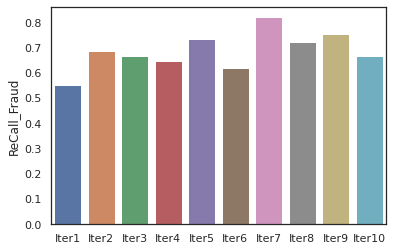

In [ ]:
recall_fraud = pd.DataFrame(report,columns=['ReCall_Fraud'])

sns.set(style="white", rc={"lines.linewidth": 3})
sns.barplot(x=['Iter1','Iter2','Iter3','Iter4','Iter5', 'Iter6', 'Iter7', 'Iter8', 'Iter9', 'Iter10'],y="ReCall_Fraud",data=recall_fraud)
plt.show()
sns.set()

In [ ]:
#Calculating FPRate, TP Rate
#Testing with multiple classifiers with different combination of featuresets
test_classifiers = ['LogisticRegression', 'DecisionTree', 'RandomForest', 'NaiveBayes']
test_features = ['ALL_FEATURES']
test_datatypes = ['ORIGINAL']
test_split = ['70']
test_seed = [42]

fp_rate_list = []
tp_rate_list = []

#Data Sample to use
for data in test_datatypes:
  data_use = getData(ccdata, data)
  #Features to use in the input data
  for feat in test_features:
    X, y = getFeatures(data_use, feat)
    #Get the classifier for modelling
    for test in test_classifiers:
      classifier = getClassifier(test)
      #Split the data based on input condition and set the relevant seed
      for split in test_split:
        for seed in test_seed:
          X_train, X_test, y_train, y_test = getTrainTestSplit(X, y, split, seed)
          print(np.unique(y_test, return_counts=True))
          print('*****Testing ',test, ', Data Split: ',split,'(%), feature:',feat,' Dataset: ',data,'*****')
          _,_,_,_,fp_rate, tp_rate = train_model(X_train, X_test, y_train, y_test, classifier)
          fp_rate_list.append(fp_rate)
          tp_rate_list.append(tp_rate)
          print('fp_rate: ',fp_rate, ', tp_rate: ',tp_rate)
          print('\n')

Data Shape:  (284807, 31)
X.Shape:  (284807, 28)  Y.Shape:  (284807,)
X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  LogisticRegression , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
fp_rate:  0.0005975675485670095 , tp_rate:  0.8762886597938144


X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  DecisionTree , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
fp_rate:  0.00030486017470833087 , tp_rate:  0.6962025316455697


X_train.shape:  (199364, 28) X_test.shape:  (85443, 28) y_train.shape:  (199364,) y_test.shape:  (85443,)
(array([0, 1]), array([85307,   136]))
*****Testing  RandomForest , Data Split:  70 (%), feature: ALL_FEATURES  Dataset:  ORIGINAL *****
fp_rate:  0.0003047172575446821 , tp_rate:  0.9322033898305084



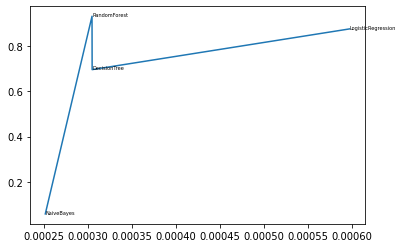

In [ ]:
#Original Data ROC Curve
for i, txt in enumerate(test_classifiers):
  plt.annotate(txt, (fp_rate_list[i], tp_rate_list[i]), fontsize = 5)

plt.plot(fp_rate_list, tp_rate_list)
plt.show()

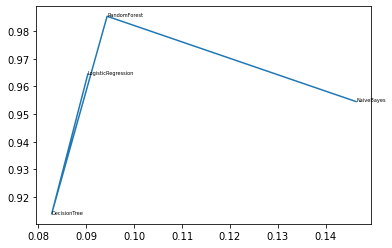

In [ ]:
#UNDER_SAMPLE ROC Curve
for i, txt in enumerate(test_classifiers):
  plt.annotate(txt, (fp_rate_list[i], tp_rate_list[i]), fontsize = 5)

plt.plot(fp_rate_list, tp_rate_list)
plt.show()

In [ ]:
#Testing with multiple classifiers with different combination of featuresets
test_classifiers = ['LogisticRegression', 'DecisionTree', 'RandomForest', 'NaiveBayes']
test_features = ['CORREL_FEATURES']
test_datatypes = ['UNDER_SAMPLE']#, 'SMOTE']
test_split = ['70'] #['90', '80', '65']
test_seed = [42]

conf_matrix_list = []
class_report_list = []

#Data Sample to use
for data in test_datatypes:
  data_use = getData(ccdata, data)
  #Features to use in the input data
  for feat in test_features:
    X, y = getFeatures(data_use, feat)
    #Get the classifier for modelling
    for test in test_classifiers:
      classifier = getClassifier(test)
      #Split the data based on input condition and set the relevant seed
      for split in test_split:
        for seed in test_seed:
          X_train, X_test, y_train, y_test = getTrainTestSplit(X, y, split, seed)
          print(np.unique(y_test, return_counts=True))
          print('*****Testing ',test, ', Data Split: ',split,'(%), feature:',feat,' Dataset: ',data,'*****')
          accuracy, conf_matrix, class_report,y_pred, fp_rate, tp_rate = train_model(X_train, X_test, y_train, y_test, classifier)
          conf_matrix_list.append(conf_matrix)
          class_report_list.append(class_report)
          print(class_report)

Data Shape:  (984, 31)
X.Shape:  (984, 16)  Y.Shape:  (984,)
X_train.shape:  (688, 16) X_test.shape:  (296, 16) y_train.shape:  (688,) y_test.shape:  (296,)
(array([0, 1]), array([146, 150]))
*****Testing  LogisticRegression , Data Split:  70 (%), feature: CORREL_FEATURES  Dataset:  UNDER_SAMPLE *****
{'Genuine': {'precision': 0.9256756756756757, 'recall': 0.9383561643835616, 'f1-score': 0.9319727891156463, 'support': 146}, 'Fraud': {'precision': 0.9391891891891891, 'recall': 0.9266666666666666, 'f1-score': 0.9328859060402684, 'support': 150}, 'accuracy': 0.9324324324324325, 'macro avg': {'precision': 0.9324324324324325, 'recall': 0.9325114155251142, 'f1-score': 0.9324293475779574, 'support': 296}, 'weighted avg': {'precision': 0.9325237399561722, 'recall': 0.9324324324324325, 'f1-score': 0.9324355172869074, 'support': 296}}
X_train.shape:  (688, 16) X_test.shape:  (296, 16) y_train.shape:  (688,) y_test.shape:  (296,)
(array([0, 1]), array([146, 150]))
*****Testing  DecisionTree , Dat

/usr/local/lib/python3.6/dist-packages/sklearn/linear_model/_logistic.py:940: ConvergenceWarning: lbfgs failed to converge (status=1):
STOP: TOTAL NO. of ITERATIONS REACHED LIMIT.

Increase the number of iterations (max_iter) or scale the data as shown in:
    https://scikit-learn.org/stable/modules/preprocessing.html
Please also refer to the documentation for alternative solver options:
    https://scikit-learn.org/stable/modules/linear_model.html#logistic-regression
  extra_warning_msg=_LOGISTIC_SOLVER_CONVERGENCE_MSG)


{'Genuine': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 146}, 'Fraud': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 150}, 'accuracy': 1.0, 'macro avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 296}, 'weighted avg': {'precision': 1.0, 'recall': 1.0, 'f1-score': 1.0, 'support': 296}}
X_train.shape:  (688, 16) X_test.shape:  (296, 16) y_train.shape:  (688,) y_test.shape:  (296,)
(array([0, 1]), array([146, 150]))
*****Testing  NaiveBayes , Data Split:  70 (%), feature: CORREL_FEATURES  Dataset:  UNDER_SAMPLE *****
{'Genuine': {'precision': 0.7371134020618557, 'recall': 0.9794520547945206, 'f1-score': 0.8411764705882353, 'support': 146}, 'Fraud': {'precision': 0.9705882352941176, 'recall': 0.66, 'f1-score': 0.7857142857142857, 'support': 150}, 'accuracy': 0.8175675675675675, 'macro avg': {'precision': 0.8538508186779867, 'recall': 0.8197260273972603, 'f1-score': 0.8134453781512605, 'support': 296}, 'weighted avg': {'precision': 0.8554

In [ ]:
conf_matrix_list[0]

array([[126,  20],
       [ 15, 135]])

In [ ]:
class_report_list[0]

{'Fraud': {'f1-score': 0.8852459016393444,
  'precision': 0.8709677419354839,
  'recall': 0.9,
  'support': 150},
 'Genuine': {'f1-score': 0.8780487804878048,
  'precision': 0.8936170212765957,
  'recall': 0.863013698630137,
  'support': 146},
 'accuracy': 0.8817567567567568,
 'macro avg': {'f1-score': 0.8816473410635746,
  'precision': 0.8822923816060397,
  'recall': 0.8815068493150685,
  'support': 296},
 'weighted avg': {'f1-score': 0.8816959702605445,
  'precision': 0.8821393459348161,
  'recall': 0.8817567567567568,
  'support': 296}}

In [ ]:
fraud_prec_list = []
gen_prec_list = []
fraud_rec_list = []
gen_rec_list = []
fraud_f1_list = []
gen_f1_list = []

label_list = ['LR', 'DT', 'RF', 'NB']


for i in range(len(class_report_list)):
    #print(class_report_list[i]['Fraud']['precision'], class_report_list[i]['Fraud']['recall'], class_report_list[i]['Fraud']['f1-score'])
    fraud_prec_list.append(class_report_list[i]['Fraud']['precision'])
    gen_prec_list.append(class_report_list[i]['Genuine']['precision'])

    fraud_rec_list.append(class_report_list[i]['Fraud']['recall'])
    gen_rec_list.append(class_report_list[i]['Genuine']['recall'])

    fraud_f1_list.append(class_report_list[i]['Fraud']['f1-score'])
    gen_f1_list.append(class_report_list[i]['Genuine']['f1-score'])     
    

In [ ]:
fraud_prec_list

[0.9391891891891891, 1.0, 1.0, 0.9705882352941176]

ValueError: ignored

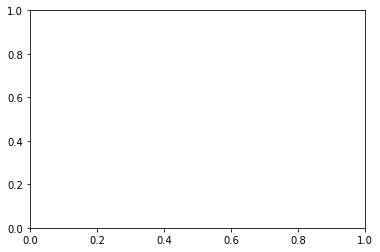

In [ ]:
plt.boxplot(fraud_prec_list, labels=label_list)

palette = ['r', 'g', 'b', 'y']

for x, val, c in zip(fraud_prec_list, label_list, palette):
    plt.scatter(x, val, alpha=0.4, color=c)

In [ ]:
class_report_list[0]['Fraud']['recall'], class_report_list[1]['Fraud']['recall'], class_report_list[2]['Fraud']['recall'], class_report_list[3]['Fraud']['recall'],

(0.9266666666666666, 1.0, 1.0, 0.66)

In [ ]:
    fraud_prec_list.append(report['Fraud']['precision'])
    gen_prec_list.append(report['Genuine']['precision'])

    fraud_rec_list.append(report['Fraud']['recall'])
    gen_rec_list.append(report['Genuine']['recall'])

    fraud_rec_list.append(report['Fraud']['f1-score'])
    gen_rec_list.append(report['Genuine']['f1-score'])   

In [ ]:
fraud_rec_list

[0.9266666666666666,
 0.9328859060402684,
 1.0,
 1.0,
 1.0,
 1.0,
 0.66,
 0.7857142857142857]

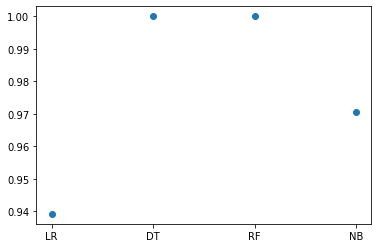

In [ ]:
plt.scatter(label_list, fraud_prec_list)

Text(0, 0.5, 'Fraud: Precision')

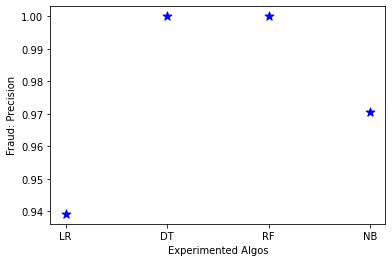

In [ ]:
plt.scatter(label_list, fraud_prec_list, c='blue', marker = '*', s= 85)
plt.xlabel('Experimented Algos')
plt.ylabel('Fraud: Precision')

Text(0, 0.5, 'Fraud: Recall')

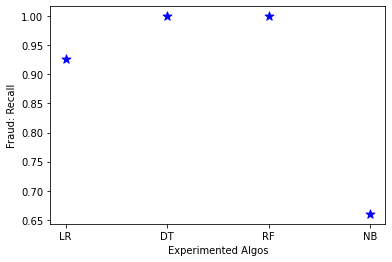

In [ ]:
plt.scatter(label_list, fraud_rec_list, c='blue', marker = '*', s= 85)
plt.xlabel('Experimented Algos')
plt.ylabel('Fraud: Recall')

Text(0, 0.5, 'Genuine: Recall')

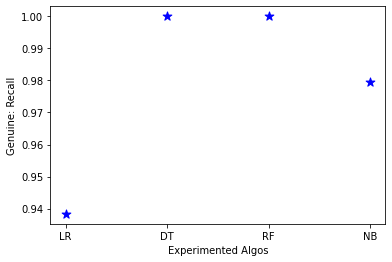

In [ ]:
plt.scatter(label_list, gen_rec_list, c='blue', marker = '*', s= 85)
plt.xlabel('Experimented Algos')
plt.ylabel('Genuine: Recall')

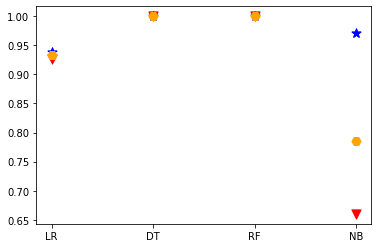

In [ ]:
plt.scatter(label_list, fraud_prec_list, c='blue', marker = '*', s= 85)
plt.scatter(label_list, fraud_prec_list, c='blue', marker = '*', s= 85)
plt.scatter(label_list, fraud_rec_list, c='red', marker = 'v', s= 85)
plt.scatter(label_list, fraud_f1_list, c='orange', marker = 'H', s= 85)

In [ ]:
len(fraud_rec_list), fraud_rec_list

(4, [0.9266666666666666, 1.0, 1.0, 0.66])

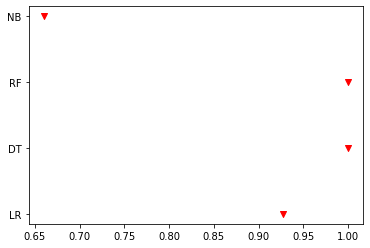

In [ ]:
plt.scatter(fraud_rec_list, label_list, c='red', marker = 'v')

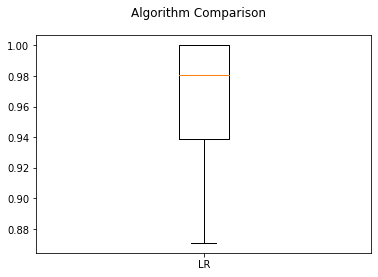

In [ ]:
# boxplot algorithm comparison
fig = plt.figure()
fig.suptitle('Algorithm Comparison')
ax = fig.add_subplot(111)
plt.boxplot(fraud_prec_list)
ax.set_xticklabels(label_list)
plt.show()

In [ ]:
def plot_classification_report(cr, title='Classification report ', with_avg_total=False, cmap=plt.cm.Blues):

    lines = cr.split('\n')

    classes = []
    plotMat = []
    for line in lines[2 : (len(lines) - 3)]:
        print(line)
        t = line.split()
        print(t)
        classes.append(t[0])
        v = [float(x) for x in t[1: len(t) - 1]]
        print(v)
        plotMat.append(v)

    if with_avg_total:
        aveTotal = lines[len(lines) - 1].split()
        classes.append('avg/total')
        vAveTotal = [float(x) for x in t[1:len(aveTotal) - 1]]
        plotMat.append(vAveTotal)


    plt.imshow(plotMat, interpolation='nearest', cmap=cmap)
    plt.title(title)
    plt.colorbar()
    x_tick_marks = np.arange(3)
    y_tick_marks = np.arange(len(classes))
    plt.xticks(x_tick_marks, ['precision', 'recall', 'f1-score'], rotation=45)
    plt.yticks(y_tick_marks, classes)
    plt.tight_layout()
    plt.ylabel('Classes')
    plt.xlabel('Measures')

In [ ]:
plot_classification_report(class_report_list[0], title='Classification report ', with_avg_total=False, cmap=plt.cm.Blues)

     Genuine       0.90      0.86      0.88       146
['Genuine', '0.90', '0.86', '0.88', '146']
[0.9, 0.86, 0.88]
       Fraud       0.87      0.91      0.89       150
['Fraud', '0.87', '0.91', '0.89', '150']
[0.87, 0.91, 0.89]

[]


IndexError: ignored